In [11]:
from pyspark.sql import SparkSession

# Initialize a SparkSession
spark = SparkSession.builder.appName('KaggleData').getOrCreate()

# Read the CSV data into a DataFrame
train_df = spark.read.csv('../data/playground-series-s3e24/train.csv', header=True, inferSchema=True)

# Show the DataFrame to verify it's loaded
train_df.show()

+---+---+----------+----------+---------+--------------+---------------+-------------+--------------+--------+----------+-------------------+-----------+------------+---+---+----------+-------------+----------------+---+---+---+-------------+-------+
| id|age|height(cm)|weight(kg)|waist(cm)|eyesight(left)|eyesight(right)|hearing(left)|hearing(right)|systolic|relaxation|fasting blood sugar|Cholesterol|triglyceride|HDL|LDL|hemoglobin|Urine protein|serum creatinine|AST|ALT|Gtp|dental caries|smoking|
+---+---+----------+----------+---------+--------------+---------------+-------------+--------------+--------+----------+-------------------+-----------+------------+---+---+----------+-------------+----------------+---+---+---+-------------+-------+
|  0| 55|       165|        60|     81.0|           0.5|            0.6|            1|             1|     135|        87|                 94|        172|         300| 40| 75|      16.5|            1|             1.0| 22| 25| 27|            0|     

In [12]:
summary_stats = train_df.describe()
summary_stats.show()

+-------+-----------------+------------------+-----------------+------------------+-----------------+------------------+------------------+-------------------+-------------------+------------------+-----------------+-------------------+------------------+------------------+------------------+------------------+------------------+-------------------+-------------------+------------------+------------------+------------------+-------------------+-------------------+
|summary|               id|               age|       height(cm)|        weight(kg)|        waist(cm)|    eyesight(left)|   eyesight(right)|      hearing(left)|     hearing(right)|          systolic|       relaxation|fasting blood sugar|       Cholesterol|      triglyceride|               HDL|               LDL|        hemoglobin|      Urine protein|   serum creatinine|               AST|               ALT|               Gtp|      dental caries|            smoking|
+-------+-----------------+------------------+----------------

In [13]:
# Sample a fraction of the DataFrame
fraction = 0.01
seed = 42  # Seed for reproducibility

sampled_df = train_df.sample(withReplacement=False, fraction=fraction, seed=seed)

# Now convert the sampled DataFrame to Pandas for visualization
sampled_pd_df = sampled_df.toPandas()

c:\Users\judea\anaconda3\envs\Kaggle\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\judea\anaconda3\envs\Kaggle\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\judea\anaconda3\envs\Kaggle\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\judea\anaconda3\envs\Kaggle\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

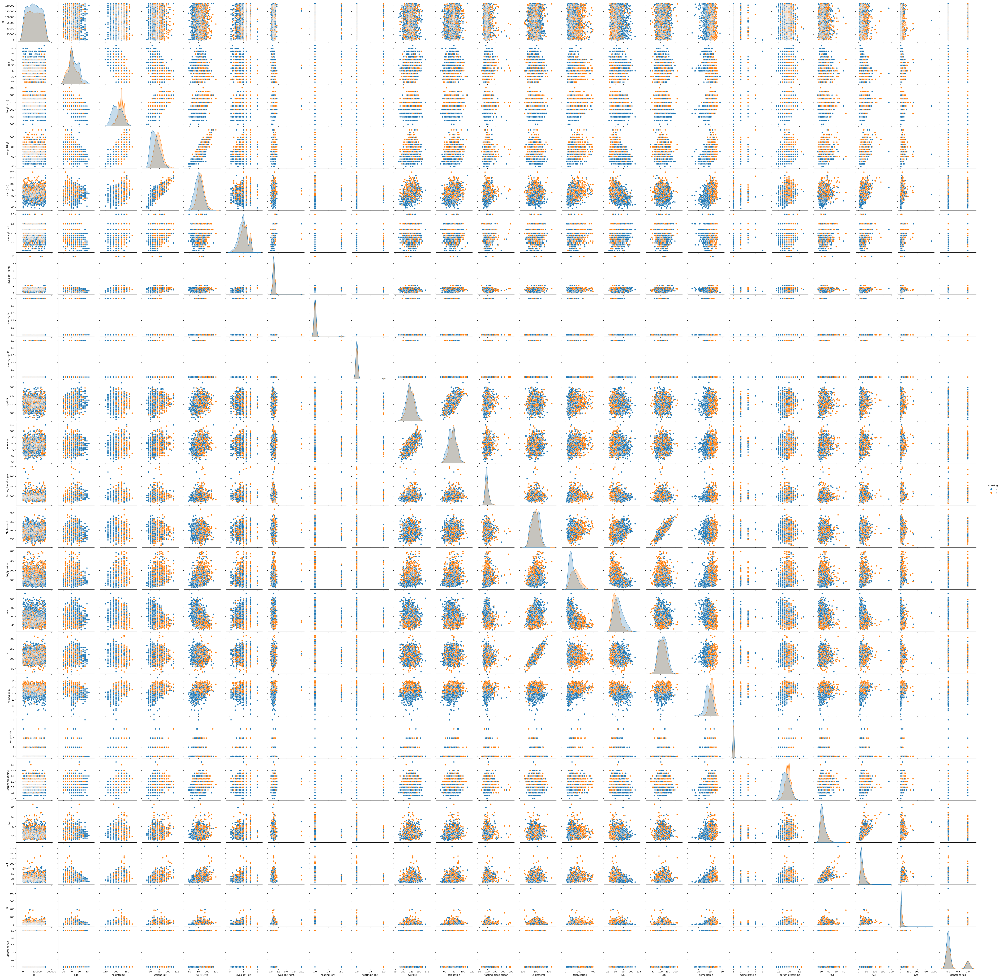

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql import SparkSession

# Convert the Spark DataFrame to a Pandas DataFrame
# df_pandas = train_df.toPandas()

# Use Seaborn to create a pair plot
sns.pairplot(sampled_pd_df, hue='smoking')

# Show the plot
plt.show()